In [18]:

import numpy as np 
import pandas as pd


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/val/normal/IM-0154-0001.jpeg
/kaggle/input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/val/normal/IM-0151-0001.jpeg
/kaggle/input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/val/normal/IM-0145-0001.jpeg
/kaggle/input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/val/normal/IM-0149-0001.jpeg
/kaggle/input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/val/normal/IM-0143-0001.jpeg
/kaggle/input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/val/normal/IM-0147-0001.jpeg
/kaggle/input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/val/normal/IM-0141-0001.jpeg
/kaggle/input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/val/normal/IM-0152-0001.jpeg
/kaggle/input/covid19-pa

In [19]:
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPooling2D,GlobalAveragePooling2D
from keras.layers import Activation, Dropout, BatchNormalization, Flatten, Dense, AvgPool2D,MaxPool2D
from keras.models import Sequential, Model
from keras.optimizers import Adam, SGD, RMSprop

import tensorflow as tf

import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

In [20]:
train="../input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/train"


In [21]:
validation="../input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/val"

In [22]:
# ImageDataGenerator(rescale=1./255,
#     shear_range=0.2,
#     zoom_range=0.2,
#     horizontal_flip=True,
#                                    width_shift_range=0.2,
#                                    height_shift_range=0.2,
#                                    rotation_range=15,
#                                    vertical_flip=True,
#                                    brightness_range=[0.5, 1.5],
#     validation_s

In [23]:
os.listdir(train)


['normal', 'corona']

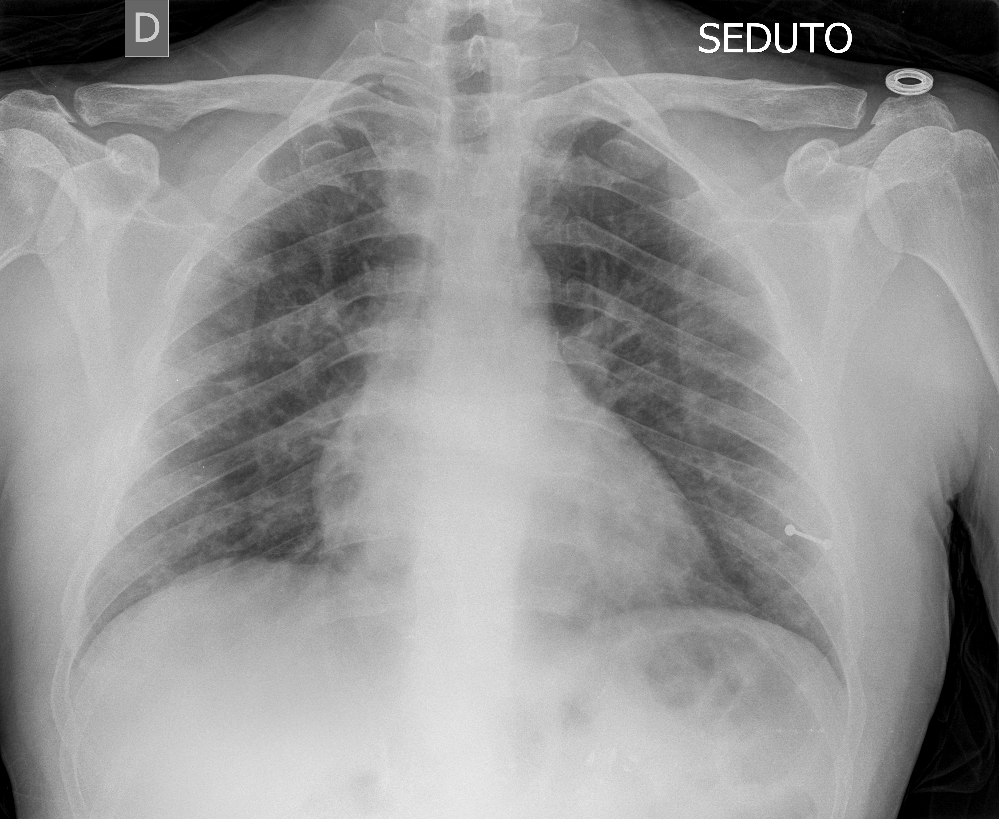

In [24]:

from PIL import Image 

im = Image.open(r"../input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/train/corona/2C10A413-AABE-4807-8CCE-6A2025594067.jpeg")  
  
im

In [25]:
im.size


(4248, 3480)

In [26]:

train_datagen = ImageDataGenerator(rescale=1/255,
                                   shear_range=0.2,
                            zoom_range=0.2,
                            horizontal_flip=True,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   rotation_range=15,
                                   vertical_flip=True,
                                   brightness_range=[0.5, 1.5],
                            )
validation_datagen=ImageDataGenerator(rescale=1/255,
    shear_range=0.2,
                            zoom_range=0.2,
                            horizontal_flip=True,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   rotation_range=15,
                                   vertical_flip=True,
                                   brightness_range=[0.5, 1.5],
                            )

train_generator= train_datagen.flow_from_directory(train,
                                       target_size=(150,150),
                                       class_mode='binary',
                                      )
val_generator = validation_datagen.flow_from_directory( validation,
                                       target_size=(150,150),
                                       class_mode='binary',
                                      )

Found 244 images belonging to 2 classes.
Found 20 images belonging to 2 classes.


In [27]:
from keras.applications.vgg16 import VGG16
import keras

In [28]:
vgg_model=VGG16(weights='imagenet',input_shape=(150,150,3),include_top=False)
model=keras.Sequential()
for layer in vgg_model.layers:
    model.add(layer)
for layer in model.layers:
    layer.trainable=False
model.add(Flatten())
model.add(Dropout(0.4))
model.add(Dense(256,activation='relu'))
model.add(Dense(1,activation='sigmoid'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 37, 37, 256)      

In [29]:
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy']
             )

In [30]:

from keras.callbacks import EarlyStopping,ModelCheckpoint

stop = EarlyStopping(
    monitor='val_accuracy', 
    mode='max',
    patience=10
)

checkpoint= ModelCheckpoint(
    filepath='./',
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

In [31]:
history=model.fit_generator(train_generator,validation_data=val_generator,epochs=50,callbacks=[stop,checkpoint])


Epoch 1/50
8/8 [==============================] - 16s 2s/step - loss: 1.5913 - accuracy: 0.5446 - val_loss: 0.5427 - val_accuracy: 0.6500
Epoch 2/50
8/8 [==============================] - 14s 2s/step - loss: 0.6272 - accuracy: 0.6285 - val_loss: 0.3276 - val_accuracy: 0.9000
Epoch 3/50
8/8 [==============================] - 15s 2s/step - loss: 0.3697 - accuracy: 0.8414 - val_loss: 0.2154 - val_accuracy: 0.9000
Epoch 4/50
8/8 [==============================] - 14s 2s/step - loss: 0.2283 - accuracy: 0.9100 - val_loss: 0.1473 - val_accuracy: 0.9500
Epoch 5/50
8/8 [==============================] - 15s 2s/step - loss: 0.1666 - accuracy: 0.9479 - val_loss: 0.1891 - val_accuracy: 0.8500
Epoch 6/50
8/8 [==============================] - 14s 2s/step - loss: 0.2184 - accuracy: 0.8976 - val_loss: 0.0419 - val_accuracy: 1.0000
Epoch 7/50
8/8 [==============================] - 15s 2s/step - loss: 0.1972 - accuracy: 0.9058 - val_loss: 0.1076 - val_accuracy: 1.0000
Epoch 8/50
8/8 [==================

In [32]:
model.save("corona_model.h5")

In [33]:
test_datagen=ImageDataGenerator(rescale=1/255,
    )
test_generator = test_datagen.flow_from_directory( "../input/covid19-patient-xray-image-dataset/COVID-19 patient X-ray image dataset/corona/test",
                                       target_size=(150,150),
                                      )

Found 20 images belonging to 2 classes.


In [34]:
prediction=model.predict(test_generator)

In [36]:
print(test_generator.classes)

[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]


In [44]:
actual=test_generator.classes

In [35]:
prediction

array([[1.8016510e-02],
       [1.0635620e-03],
       [9.9935156e-01],
       [1.7139195e-03],
       [1.5036272e-03],
       [8.7529334e-04],
       [6.5621833e-05],
       [1.0225871e-01],
       [9.9997711e-01],
       [7.8121389e-05],
       [9.9948597e-01],
       [9.9981862e-01],
       [9.9930477e-01],
       [9.9924040e-01],
       [1.4725643e-04],
       [9.9996316e-01],
       [9.9756843e-01],
       [3.3362091e-03],
       [9.9906248e-01],
       [9.9976426e-01]], dtype=float32)

In [40]:
result=[]

In [41]:
for pre in prediction:
    if pre>0.5:
        result.append(1)
    else:
        result.append(0)

In [42]:
result

[0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]

In [43]:
>>> from sklearn.metrics import confusion_matrix


In [45]:
confusion_matrix(actual, result)

array([[8, 2],
       [2, 8]])

In [46]:
val_generator.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
      dtype=int32)

In [48]:
labels = (val_generator.class_indices)


In [49]:
print(labels)

{'corona': 0, 'normal': 1}
